# **Finding Lane Lines on the Road** 
***
In this project, you will use the tools you learned about in the lesson to identify lane lines on the road.  You can develop your pipeline on a series of individual images, and later apply the result to a video stream (really just a series of images). Check out the video clip "raw-lines-example.mp4" (also contained in this repository) to see what the output should look like after using the helper functions below. 

Once you have a result that looks roughly like "**raw-lines-example.mp4**", you'll need to get creative and try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines.  You can see an example of the result you're going for in the video "**P1_example.mp4**".  Ultimately, you would like to **draw just one line for the left side of the lane, and one for the right**.

---
Let's have a look at our first image called '**test_images/solidWhiteRight.jpg**'.  Run the 2 cells below (hit Shift-Enter or the "play" button above) to display the image.

**Note** If, at any point, you encounter frozen display windows or other confounding issues, you can always start again with a clean slate by going to the "Kernel" menu above and selecting "Restart & Clear Output".

---

**The tools you have are color selection, region of interest selection, grayscaling, Gaussian smoothing, Canny Edge Detection and Hough Tranform line detection.  You  are also free to explore and try other techniques that were not presented in the lesson.  Your goal is piece together a pipeline to detect the line segments in the image, then average/extrapolate them and draw them onto the image for display (as below).  Once you have a working pipeline, try it out on the video stream below.**

---

<figure>
 <img src="line-segments-example.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your output should look something like this (above) after detecting line segments using the helper functions below </p> 
 </figcaption>
</figure>
 <p></p> 
<figure>
 <img src="laneLines_thirdPass.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your goal is to connect/average/extrapolate line segments to get output like this</p> 
 </figcaption>
</figure>

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.linear_model import ElasticNet
import numpy as np
import cv2
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

This image is: <class 'numpy.ndarray'> with dimensions (540, 960, 3)


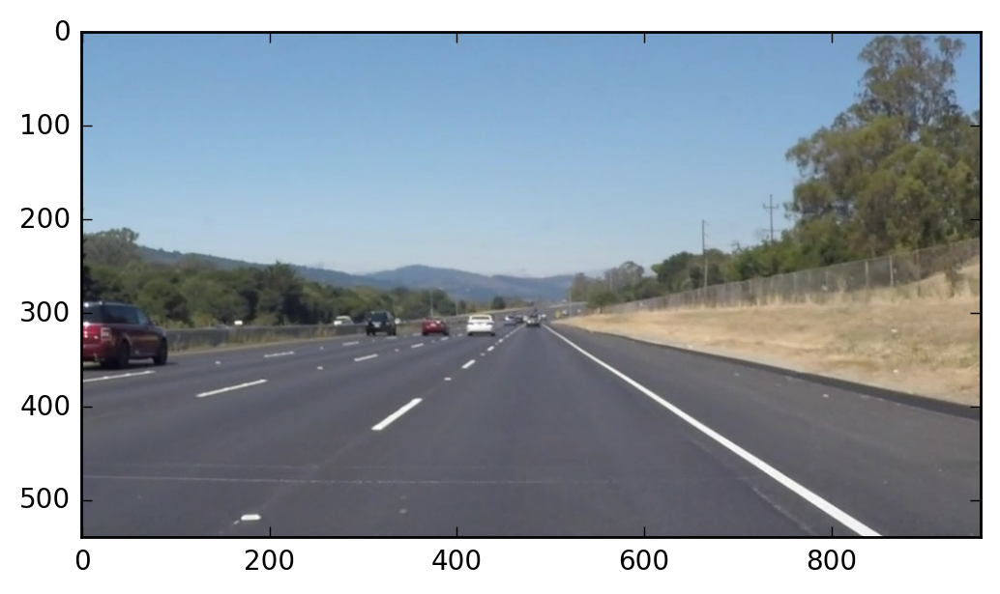

In [2]:
#reading in an image
image = mpimg.imread('test_images/solidWhiteRight.jpg')
#printing out some stats and plotting
print('This image is: {0} with dimensions {1}'.format(type(image), image.shape))
plt.imshow(image)  #call as plt.imshow(gray, cmap='gray') to show a grayscaled image

**Some OpenCV functions (beyond those introduced in the lesson) that might be useful for this project are:**

`cv2.inRange()` for color selection  
`cv2.fillPoly()` for regions selection  
`cv2.line()` to draw lines on an image given endpoints  
`cv2.addWeighted()` to coadd or overlay two images
`cv2.cvtColor()` to grayscale or change color
`cv2.imwrite()` to output images to file  
`cv2.bitwise_and()` to apply a mask to an image

**Check out the OpenCV documentation to learn about these and discover even more awesome functionality!**

**Helper functions and lane detection pipeline**

In [3]:
import math

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.

    vertices shall have the shape (num_of_polygon, num_of_vertices, 2)    
    eg: vertices = np.array([[(wd*.45, ht*.53),(wd*.05, ht), (wd*.98, ht), (wd*.55, ht*.53)]], dtype=np.int32)
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        mask_color = (255,) * channel_count
    else:
        mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap, line_thickness=2, line_color=[0, 255, 0],):
    """Returns an image with hough lines drawn.

    `img` should be the output of a Canny transform.    
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((*img.shape, 3), dtype=np.uint8)
    draw_lines(line_img, lines, thickness=line_thickness, color=line_color)
    
    return line_img

# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, alpha=0.8, beta=1., gamma=0.):
    """Return weighted sum of two images
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, alpha, img, beta, gamma)

def draw_lines(img, lines, thickness=2, color=[255, 0, 0]):
    """ Draw interpolated lanes on img

    """
        
    lane_1st, lane_2nd = [], []
    height, width, _ = img.shape
    
    # separate the line segments based on slope and their position in the image
    for line in lines:
        for x1,y1,x2,y2 in line:
            if   ((x2-x1) != 0) and ((y2-y1)/(x2-x1) < 0) and ((x1+x2)/2/width < 0.55):
                lane_1st.append(line)
            elif ((x2-x1) != 0) and ((y2-y1)/(x2-x1) > 0) and ((x1+x2)/2/width > 0.55):
                lane_2nd.append(line)
    
    # fit the left and right lane separately with ElasticNet 
    x_pred = np.arange(img.shape[1]).reshape(-1,1)
    for lane in [np.array(lane_1st), np.array(lane_2nd)]:
        lane = lane.reshape(lane.shape[0]*2, 2)
        X, y = lane[:,0], lane[:,1]
        reg  = ElasticNet().fit(X.reshape(-1,1),y)
        y_pred = np.hstack((x_pred, reg.predict(x_pred).reshape(-1,1)))
        
        cv2.polylines(img,np.int32([y_pred]),False,color,thickness)

def select_color(img, colors):
    ''' Return img with specified color selected
    
        colors is a list of (color_lower, color_upper) tuples
    '''
    
    img_color_select = np.zeros_like(img)

    for color_lower, color_upper in colors:    
        color_mask = cv2.inRange(img, color_lower, color_upper)
        img_color_select += cv2.bitwise_and(img, img, mask=color_mask)

    return img_color_select


In [4]:
# pipline for lanes detection on a single image
def lane_detection(img,
                   colors,
                   ROI_vertex_scales=[(0.48, 0.60), (0.55, 0.60), (0.95, 1), (0.05, 1)],
                   GB_kernel_size = 3, 
                   Canny_low_th = 40, 
                   Canny_high_th = 120,
                   Hough_rho = 1.5, 
                   Hough_theta = 1, 
                   Hough_threshold = 5,
                   Hough_min_line_length = 7, 
                   Hough_max_line_gap = 75, 
                   Hough_line_thickness = 10, 
                   Hough_line_color=[255, 0, 0],
                   overlay_alpha = 1, 
                   overlay_beta = 0.85, 
                   overlay_gamma = 0,
                   debug = 0):
    
    '''Return an image with detected lanes overlaid on the original image
    
    ======================
    Lane detction pipeline

    original image -> color selection -> grayscale -> ROI selection -> Gaussian blur
                   -> Canny edge detection -> Hough line detection -> lane separation
                   -> lane interpolation -> overlay of detected lanes and original image
    
    ===================================
    Explaination of selected parameters

    colors:
        a list of (color_lower, color_upper) tuples

    ROI_vertex_scales:
        a list of (x_scale, y_scale) tuples in terms of percentages of (width, heigh), 
        specifiying a polygonal region of interest
        
    debug:
        when debug is set to 1, the detected lane image would also be returned
    '''
    
    img = np.array(img).astype('uint8')
    img_color_select = select_color(img, colors)
    img_gray = grayscale(img_color_select)
    
    ht,wd,_  = img.shape
    vertices = np.array([[(wd*wd_scale, ht*ht_scale) for (wd_scale, ht_scale) in ROI_vertex_scales]], dtype=np.int32)  
    
    img_gray_masked = region_of_interest(img_gray, vertices)  
    img_gray_blur   = gaussian_blur(img_gray_masked, GB_kernel_size)
    
    img_edges = canny(img_gray_blur, Canny_low_th, Canny_high_th)
    img_lines = hough_lines(img_edges, Hough_rho, Hough_theta, Hough_threshold, 
                            Hough_min_line_length, Hough_max_line_gap, 
                            Hough_line_thickness, Hough_line_color)

    img_lines = region_of_interest(img_lines,vertices)
    
    img_overlay = weighted_img(img, img_lines, overlay_alpha, overlay_beta, overlay_gamma)
    
    if debug == 1:
        return img_overlay, img_lines
    else:
        return img_overlay

## Test on Images

Now you should build your pipeline to work on the images in the directory "test_images"  
**You should make sure your pipeline works well on these images before you try the videos.**

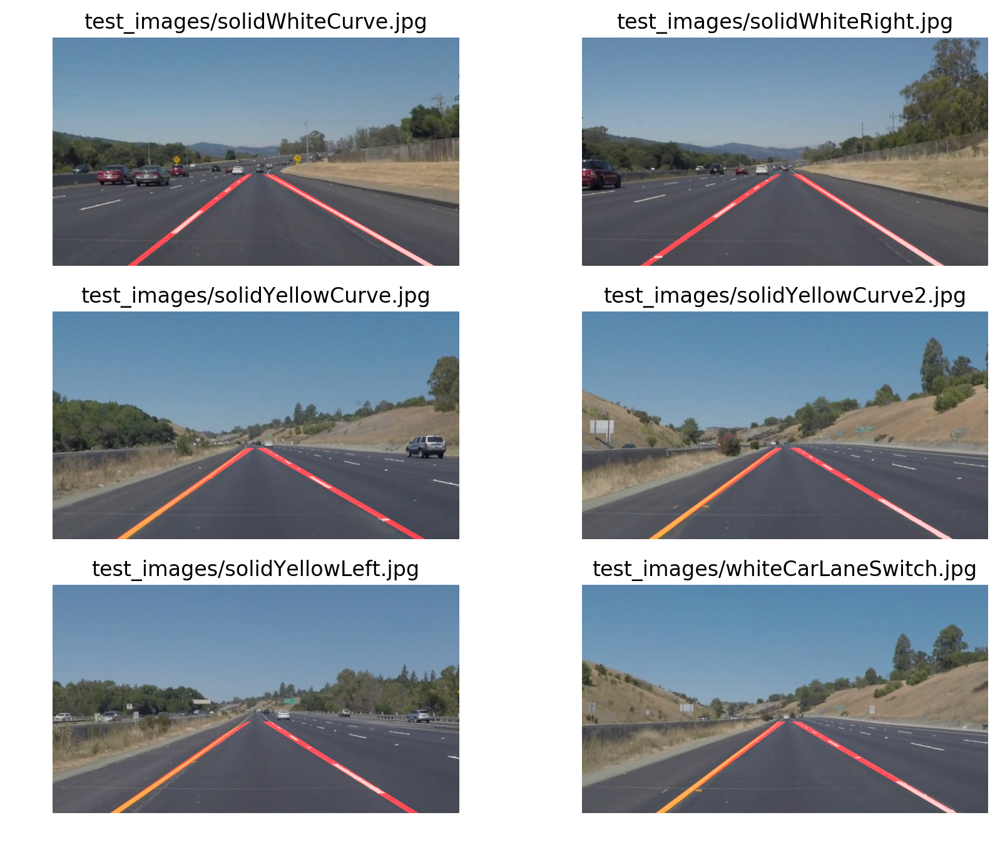

In [5]:
import os
img_dir = "test_images/"
img_files = [img_dir + img_file for img_file in os.listdir(img_dir) if img_file.endswith('.jpg')]

# colors = [(white_lower_bound, white_hight_bound),
#           (yellow_lower_bound, yellow_hight_bound)]
colors = [(np.array([210, 210, 210], dtype=np.uint8), np.array([255, 255, 255], dtype=np.uint8)),
          (np.array([120, 140, 50],  dtype=np.uint8), np.array([255, 200, 120], dtype=np.uint8))]

roi_vertex_scales=[(0.48, 0.60), (0.55, 0.60), (0.95, 1), (0.05, 1)]

plt.figure(figsize=(10,8))
for idx, img_file in enumerate(img_files):
    img = mpimg.imread(img_file).astype('uint8')
    img_overlay = lane_detection(img, colors=colors, ROI_vertex_scales=roi_vertex_scales)

    plt.subplot(len(img_files)/2, 2, idx+1)
    plt.imshow(img_overlay)
    plt.axis('off')
    plt.title(img_file)
 
plt.show()

run your solution on all test_images and make copies into the test_images directory).

## Test on Videos

You know what's cooler than drawing lanes over images? Drawing lanes over video!

We can test our solution on two provided videos:

`solidWhiteRight.mp4`

`solidYellowLeft.mp4`

In [6]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def process_image(img):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image with lines are drawn on lanes)
    
    # the solution is detailed in the function lane_detection above
    
    return lane_detection(img, colors=colors, ROI_vertex_scales=roi_vertex_scales)

In [7]:
# Apply lane detection algorithm on every frame for each video clip
clips_files = ["solidWhiteRight.mp4", "solidYellowLeft.mp4","challenge.mp4", ]

for clip_file in clips_files:
    clip = VideoFileClip(clip_file)
    clip_out = clip.fl_image(process_image)
    %time clip_out.write_videofile("z_sol_"+clip_file, audio=False)
    print("======================================================")

[MoviePy] >>>> Building video z_sol_solidWhiteRight.mp4
[MoviePy] Writing video z_sol_solidWhiteRight.mp4


100%|█████████▉| 221/222 [00:02<00:00, 83.42it/s]     | 8/222 [00:00<00:02, 79.23it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: z_sol_solidWhiteRight.mp4 

CPU times: user 2.45 s, sys: 205 ms, total: 2.65 s
Wall time: 2.96 s
[MoviePy] >>>> Building video z_sol_solidYellowLeft.mp4
[MoviePy] Writing video z_sol_solidYellowLeft.mp4


100%|█████████▉| 681/682 [00:07<00:00, 86.38it/s]     | 9/682 [00:00<00:08, 83.08it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: z_sol_solidYellowLeft.mp4 

CPU times: user 7.32 s, sys: 589 ms, total: 7.91 s
Wall time: 8.17 s
[MoviePy] >>>> Building video z_sol_challenge.mp4
[MoviePy] Writing video z_sol_challenge.mp4


100%|██████████| 251/251 [00:05<00:00, 45.28it/s]     | 6/251 [00:00<00:04, 52.26it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: z_sol_challenge.mp4 

CPU times: user 5.17 s, sys: 346 ms, total: 5.52 s
Wall time: 6.13 s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [8]:
import io 
import base64
    
def vid_html(vid_file, vid_width=960, vid_height=540):
    '''return a HTML string for embeding mp4 video
    
    ==============
    example usage: 
    
    import io 
    import base64
    from IPython.display import HTML 
    
    HTML(vid_html("test_output.mp4"))
    '''
    
    vid = io.open(vid_file, 'r+b').read()    
    vid_encoded = base64.b64encode(vid)
    
    vid_html_str = """
    <video width="{0}" height="{1}" controls>
        <source src="data:video/mp4;base64,{2}" type="video/mp4">
    </video>""".format(vid_width, vid_height, vid_encoded.decode('ascii'))
    
    return vid_html_str


In [9]:
HTML(vid_html("z_sol_" + clips_files[0]))

In [10]:
HTML(vid_html("z_sol_" + clips_files[1]))

## Optional Challenge

Try your lane finding pipeline on the video below.  Does it still work?  Can you figure out a way to make it more robust?  If you're up for the challenge, modify your pipeline so it works with this video and submit it along with the rest of your project!

In [11]:
HTML(vid_html("z_sol_" + clips_files[2]))

## Reflections

Congratulations on finding the lane lines!  As the final step in this project, we would like you to share your thoughts on your lane finding pipeline... specifically, how could you imagine making your algorithm better / more robust?  Where will your current algorithm be likely to fail?

Please add your thoughts below,  and if you're up for making your pipeline more robust, be sure to scroll down and check out the optional challenge video below!


Despite the adequate performance in relatively ideal road conditions, the current iteration of lane detection algorithm has several disadvantages.

1. The lane color is specified and tuned manually. In differnt lighting conditions, the lane color might fall outside the color range specified , thus causing the lane detection algorithm to fail.  More road and weather conditions need to tested against to imporve the lane color selection.

2. The lane interplation is currently handeled by a linear regression method (ElasticNet), thus failing to capture the curvature of the lanes. Non-linear interplation methods could be used, but might incur performace penalities. 

3. It's unclear how the algorithm might perform if there's an object (car, pedestrain) within the ROI selected for lane detection. 

## Submission

If you're satisfied with your video outputs it's time to submit!  Submit this ipython notebook for review.
